Nama     : **Muhamad Ilyas**               
Email    : **181240000831@unisnu.ac.id**   
Domisili : **Kabupaten Jepara, Jawa Tengah**

# **Klasifikasi Kepuasan Pelanggan Terhadap Maskapai Penerbangan**

## **Domain Proyek**
Domain Proyek yang diambil adalah **Transportasi** dengan permasalahan klasifikasi kepuasan pelanggan terhadap maskapai penerbangan dan dalam penyelesaiaannya menggunakan metode klasifikasi dengan pendekatan **Random Forest**, **AdaBoost** dan **SVM**.



### **Menghubungkan dengan Google Drive**

In [1]:
#menghubungkan dengan google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### **Import Library**

In [4]:
#import library
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
import seaborn as sns
import missingno
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import plotly.express as ex
from sklearn.preprocessing import  OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score as f1
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn import svm
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
import itertools
from sklearn import metrics
from sklearn.datasets import load_breast_cancer
from keras.models import Sequential
from keras.layers import Dense
import tensorflow as tf

### **Dataset**

In [5]:
#membaca file
df = pd.read_csv('/content/drive/MyDrive/Dataset/Airline-Passenger-Satisfaction/train.csv')
df

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,103899,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,neutral or dissatisfied
103900,103900,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0.0,satisfied
103901,103901,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0,neutral or dissatisfied
103902,103902,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied


## **Data Understanding**

### **Exploratory Data Analysis**

#### **Deskripsi Variabel**

In [6]:
#mengecek informasi dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 25 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Unnamed: 0                         103904 non-null  int64  
 1   id                                 103904 non-null  int64  
 2   Gender                             103904 non-null  object 
 3   Customer Type                      103904 non-null  object 
 4   Age                                103904 non-null  int64  
 5   Type of Travel                     103904 non-null  object 
 6   Class                              103904 non-null  object 
 7   Flight Distance                    103904 non-null  int64  
 8   Inflight wifi service              103904 non-null  int64  
 9   Departure/Arrival time convenient  103904 non-null  int64  
 10  Ease of Online booking             103904 non-null  int64  
 11  Gate location                      1039

In [7]:
#mengecek deskripsi statistik data
df.describe()

,Unnamed: 0,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103594.000000
mean,51951.500000,64924.210502,39.379706,1189.448375,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,14.815618,15.178678
std,29994.645522,37463.812252,15.114964,997.147281,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,38.230901,38.698682
min,0.000000,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25975.750000,32533.750000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,51951.500000,64856.500000,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,77927.250000,97368.250000,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,103903.000000,129880.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


####**Menangani Missing Value dan Ouliers**

In [8]:
#menghapus kolom yang tidak diperlukan
df.drop(['Unnamed: 0','id'], axis=1, inplace=True)

In [9]:
# Memeriksa jumlah nilai nol

round((df.isnull().sum() * 100)/(df.shape[0]),2)

Gender                               0.0
Customer Type                        0.0
Age                                  0.0
Type of Travel                       0.0
Class                                0.0
Flight Distance                      0.0
Inflight wifi service                0.0
Departure/Arrival time convenient    0.0
Ease of Online booking               0.0
Gate location                        0.0
Food and drink                       0.0
Online boarding                      0.0
Seat comfort                         0.0
Inflight entertainment               0.0
On-board service                     0.0
Leg room service                     0.0
Baggage handling                     0.0
Checkin service                      0.0
Inflight service                     0.0
Cleanliness                          0.0
Departure_Delay_in_Minutes           0.0
Arrival_Delay_in_Minutes             0.3
satisfaction                         0.0
dtype: float64

In [10]:
#cek ada berapa missing value pada kolom Arrival Delay in Minutes
df['Arrival_Delay_in_Minutes'].isnull()

0         False
1         False
2         False
3         False
4         False
          ...  
103899    False
103900    False
103901    False
103902    False
103903    False
Name: Arrival_Delay_in_Minutes, Length: 103904, dtype: bool

In [11]:
#menghapus nilai dan menjadikannya sama dengan nilai yang lain
df.dropna(inplace=True)
df.isnull().sum()

Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure_Delay_in_Minutes           0
Arrival_Delay_in_Minutes             0
satisfaction                         0
dtype: int64

In [12]:
# Memeriksa jumlah nilai nol

round((df.isnull().sum() * 100)/(df.shape[0]),2)

Gender                               0.0
Customer Type                        0.0
Age                                  0.0
Type of Travel                       0.0
Class                                0.0
Flight Distance                      0.0
Inflight wifi service                0.0
Departure/Arrival time convenient    0.0
Ease of Online booking               0.0
Gate location                        0.0
Food and drink                       0.0
Online boarding                      0.0
Seat comfort                         0.0
Inflight entertainment               0.0
On-board service                     0.0
Leg room service                     0.0
Baggage handling                     0.0
Checkin service                      0.0
Inflight service                     0.0
Cleanliness                          0.0
Departure_Delay_in_Minutes           0.0
Arrival_Delay_in_Minutes             0.0
satisfaction                         0.0
dtype: float64

In [13]:
#cek nilai kosong pada kolom Arrival_Delay_in_Minutes
df.loc[(df['Arrival_Delay_in_Minutes']==0)]

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied
5,Female,Loyal Customer,26,Personal Travel,Eco,1180,3,4,2,1,1,2,1,1,3,4,4,4,4,1,0,0.0,neutral or dissatisfied
7,Female,Loyal Customer,52,Business travel,Business,2035,4,3,4,4,5,5,5,5,5,5,5,4,5,4,4,0.0,satisfied
8,Female,Loyal Customer,41,Business travel,Business,853,1,2,2,2,4,3,3,1,1,2,1,4,1,2,0,0.0,neutral or dissatisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103898,Male,Loyal Customer,50,Personal Travel,Eco,1620,3,1,3,4,2,3,2,2,4,3,4,2,4,2,0,0.0,neutral or dissatisfied
103899,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,neutral or dissatisfied
103900,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0.0,satisfied
103902,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied


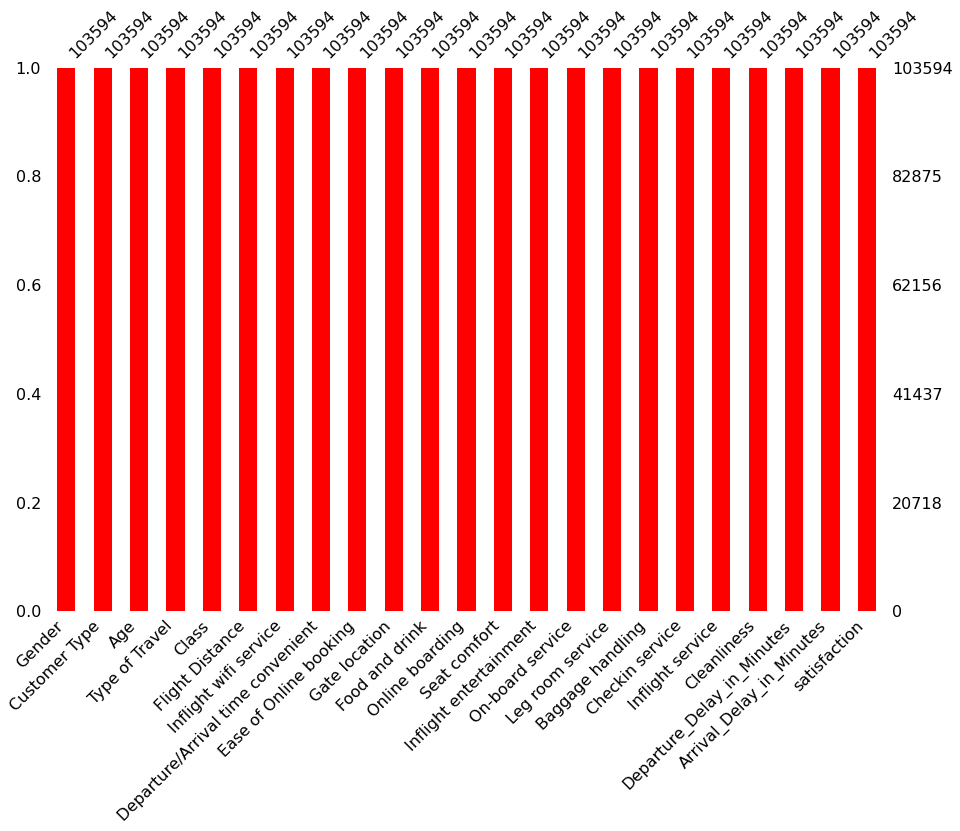

In [14]:
#Mengecek misingvalue dengan menggunakan missingno
missingno.bar(df, color = 'red', figsize = (15,10))
plt.show()

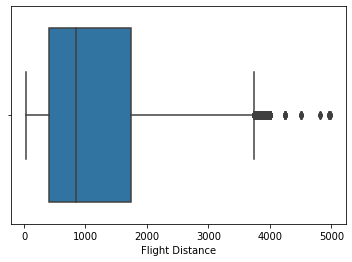

In [15]:
#boxplot untuk mendeteksi outliers untuk Jarak Penerbangan
sns.boxplot(x=df['Flight Distance'])

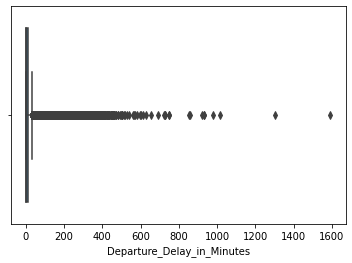

In [16]:
#boxplot untuk mendeteksi outliers untuk Waktu keberangkatan yang tertunda
sns.boxplot(x=df['Departure_Delay_in_Minutes'])

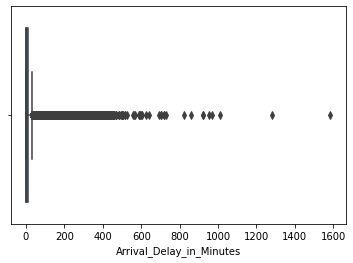

In [17]:
#boxplot untuk mendeteksi outliers untuk Waktu kedatangan yang tertunda
sns.boxplot(x=df['Arrival_Delay_in_Minutes'])

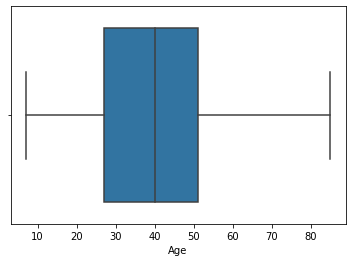

In [18]:
#boxplot untuk mendeteksi outliers untuk Umur
sns.boxplot(x=df['Age'])

In [19]:
#mengatasi outlier
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR=Q3-Q1
df=df[~((df<(Q1-1.5*IQR))|(df>(Q3+1.5*IQR))).any(axis=1)]
 
# Cek ukuran dataset
df.shape

(74743, 23)

#### **Exploratory Data Analysis - Univariate Analysis**

In [20]:
#membagi dataset menjadi numerical features dan categorical features.
numerical_features = ['Age','Flight Distance','Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']
categorical_features = ['Customer Type','Type of Travel', 'Class', 'Inflight wifi service', 'Departure/Arrival time convenient', 'Ease of Online booking','Gate location','Food and drink','Online boarding','Seat comfort','Inflight entertainment','On-board service','Leg room service','Baggage handling','Checkin service','Inflight service','Cleanliness']

In [21]:
# EDA pada Gender
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Gender'],name='Box Plot Jenis Kelamin',boxmean=True)
tr2=go.Histogram(x=df['Gender'],name='Histogram Jenis Kelamin')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian Jenis Kelamin")
fig.show()
ex.pie(df,names='Gender',title='Pembagian Jenis Kelamin',hole=0.33)

Output hidden; open in https://colab.research.google.com to view.

In [22]:
# EDA pada Jenis Pelanggan
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Customer Type'],name='Box Plot Jenis Pelanggan',boxmean=True)
tr2=go.Histogram(x=df['Customer Type'],name='Histogram Jenis Pelanggan')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian Jenis Pelanggan")
fig.show()
ex.pie(df,names='Customer Type',title='Pembagian Jenis Pelanggan',hole=0.33)

Output hidden; open in https://colab.research.google.com to view.

In [23]:
#EDA pada Tujuan penerbangan
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Type of Travel'],name='Box Plot Tujuan penerbangan',boxmean=True)
tr2=go.Histogram(x=df['Type of Travel'],name='Histogram Tujuan penerbangan')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian Tujuan penerbangan")
fig.show()
ex.pie(df,names='Type of Travel',title='Pembagian Tujuan penerbangan',hole=0.33)

Output hidden; open in https://colab.research.google.com to view.

In [24]:
#EDA untuk Kelas perjalanan
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Class'],name='Box Plot Kelas perjalanan',boxmean=True)
tr2=go.Histogram(x=df['Class'],name='Histogram Kelas perjalanan')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian Kelas perjalanan")
fig.show()
ex.pie(df,names='Class',title='Pembagian Kelas perjalanan',hole=0.33)

Output hidden; open in https://colab.research.google.com to view.

In [25]:
#EDA untuk kepuasan layanan wifi 
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Inflight wifi service'],name='Box Plot kepuasan layanan wifi ',boxmean=True)
tr2=go.Histogram(x=df['Inflight wifi service'],name='Histogram kepuasan layanan wifi ')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan layanan wifi ")
fig.show()
ex.pie(df,names='Inflight wifi service',title='Pembagian kepuasan layanan wifi ',hole=0.33)

In [26]:
#EDA untuk Kualifikasi Tingkat kepuasan waktu Keberangkatan
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Departure/Arrival time convenient'],name='Box Plot kepuasan waktu Keberangkatan',boxmean=True)
tr2=go.Histogram(x=df['Departure/Arrival time convenient'],name='Histogram kepuasan waktu Keberangkatan')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan waktu Keberangkatan")
fig.show()
ex.pie(df,names='Departure/Arrival time convenient',title='Pembagian kepuasan waktu Keberangkatan',hole=0.33)

In [27]:
#EDA untuk Kategori kepuasan pemesanan online
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Ease of Online booking'],name='Box Plot kepuasan pemesanan online',boxmean=True)
tr2=go.Histogram(x=df['Ease of Online booking'],name='Histogram kepuasan pemesanan online')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan pemesanan online")
fig.show()
ex.pie(df,names='Ease of Online booking',title='Pembagian kepuasan pemesanan online',hole=0.33)

In [28]:
#EDA untuk kepuasan lokasi Gerbang
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Gate location'],name='Box Plot kepuasan lokasi Gerbang',boxmean=True)
tr2=go.Histogram(x=df['Gate location'],name='Histogram kepuasan lokasi Gerbang')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan lokasi Gerbang")
fig.show()
ex.pie(df,names='Gate location',title='Pembagian kepuasan lokasi Gerbang',hole=0.33)

In [29]:
#EDA untuk kepuasan Makanan dan minuman
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Food and drink'],name='Box Plot kepuasan Makanan dan minuman',boxmean=True)
tr2=go.Histogram(x=df['Food and drink'],name='Histogram kepuasan Makanan dan minuman')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan Makanan dan minuman")
fig.show()
ex.pie(df,names='Food and drink',title='Pembagian kepuasan Makanan dan minuman',hole=0.33)

In [30]:
#EDA untuk kepuasan kepuasan boarding online
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Online boarding'],name='Box Plot kepuasan boarding online',boxmean=True)
tr2=go.Histogram(x=df['Online boarding'],name='Histogram kepuasan boarding online')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan boarding online")
fig.show()
ex.pie(df,names='Online boarding',title='Pembagian kepuasan boarding online',hole=0.33)

In [31]:
#EDA untuk kenyamanan Kursi
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Seat comfort'],name='Box Plot kenyamanan Kursi',boxmean=True)
tr2=go.Histogram(x=df['Seat comfort'],name='Histogram kenyamanan Kursi')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kenyamanan Kursi")
fig.show()
ex.pie(df,names='Seat comfort',title='Pembagian kenyamanan Kursi',hole=0.33)

In [32]:
#EDA untuk kepuasan hiburan dalam pesawat
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Inflight entertainment'],name='Box Plot kepuasan hiburan dalam pesawat',boxmean=True)
tr2=go.Histogram(x=df['Inflight entertainment'],name='Histogram kepuasan hiburan dalam pesawat')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan hiburan dalam pesawat")
fig.show()
ex.pie(df,names='Inflight entertainment',title='Pembagian kepuasan hiburan dalam pesawat',hole=0.33)

In [33]:
#EDA untuk kepuasan layanan On-board
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['On-board service'],name='Box Plot kepuasan layanan On-board',boxmean=True)
tr2=go.Histogram(x=df['On-board service'],name='Histogram kepuasan layanan On-board')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan layanan On-board")
fig.show()
ex.pie(df,names='On-board service',title='Pembagian kepuasan layanan On-board',hole=0.33)

In [34]:
#EDA untuk kepuasan layanan kamar Kaki
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Leg room service'],name='Box Plot kepuasan layanan kamar Kaki',boxmean=True)
tr2=go.Histogram(x=df['Leg room service'],name='Histogram kepuasan layanan kamar Kaki')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan layanan kamar Kaki")
fig.show()
ex.pie(df,names='Leg room service',title='Pembagian kepuasan layanan kamar Kaki',hole=0.33)

In [35]:
#EDA untuk kepuasan penanganan bagasi
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Baggage handling'],name='Box Plot kepuasan penanganan bagasi',boxmean=True)
tr2=go.Histogram(x=df['Baggage handling'],name='Histogram kepuasan penanganan bagasi')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan penanganan bagasi")
fig.show()
ex.pie(df,names='Baggage handling',title='Pembagian kepuasan penanganan bagasi',hole=0.33)

In [36]:
#EDA untuk kepuasan layanan Check-in
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Checkin service'],name='Box Plot kepuasan layanan Check-in',boxmean=True)
tr2=go.Histogram(x=df['Checkin service'],name='Histogram kepuasan layanan Check-in')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan layanan Check-in")
fig.show()
ex.pie(df,names='Checkin service',title='Pembagian kepuasan layanan Check-in',hole=0.33)

In [37]:
#EDA untuk kepuasan layanan dalam penerbangan
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Inflight service'],name='Box Plot kepuasan layanan',boxmean=True)
tr2=go.Histogram(x=df['Inflight service'],name='Histogram kepuasan layanan')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan layanan dalam penerbangan")
fig.show()
ex.pie(df,names='Inflight service',title='Pembagian kepuasan layanan dalam penerbangan',hole=0.33)

In [38]:
#EDA untuk kepuasan Kebersihan
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['Cleanliness'],name='Box Plot kepuasan Kebersihan',boxmean=True)
tr2=go.Histogram(x=df['Cleanliness'],name='Histogram kepuasan Kebersihan')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Pembagian kepuasan Kebersihan")
fig.show()
ex.pie(df,names='Cleanliness',title='Pembagian kepuasan Kebersihan',hole=0.33)

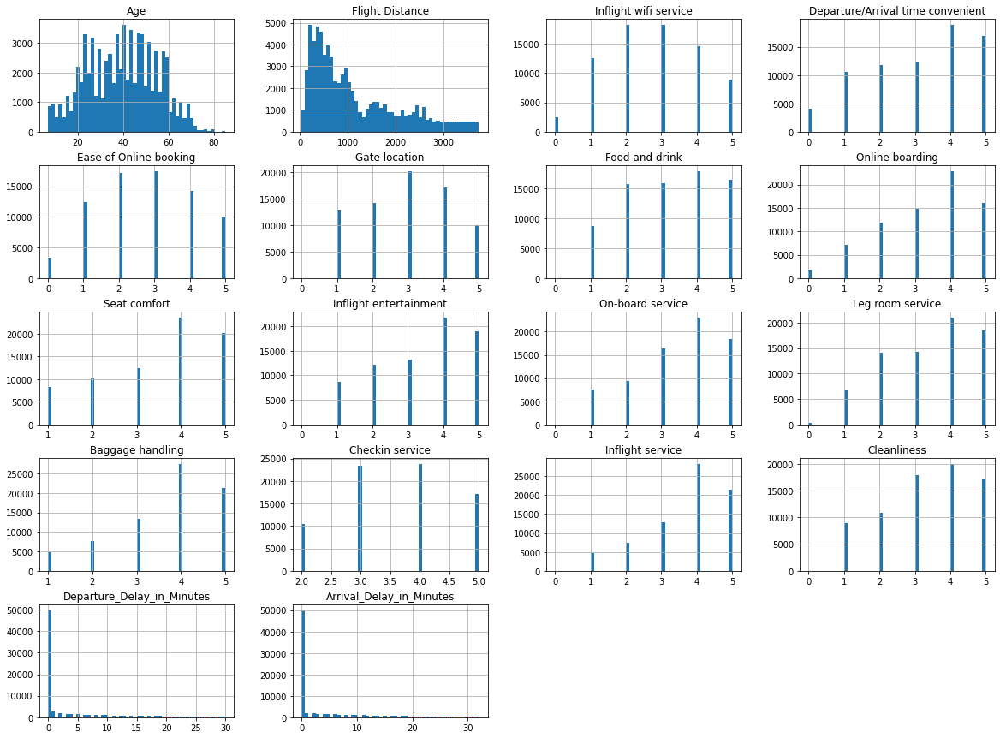

In [39]:
#numeric features
df.hist(bins=50, figsize=(20,15))
plt.show()

#### **Exploratory Data Analysis - Multivariate Analysis**

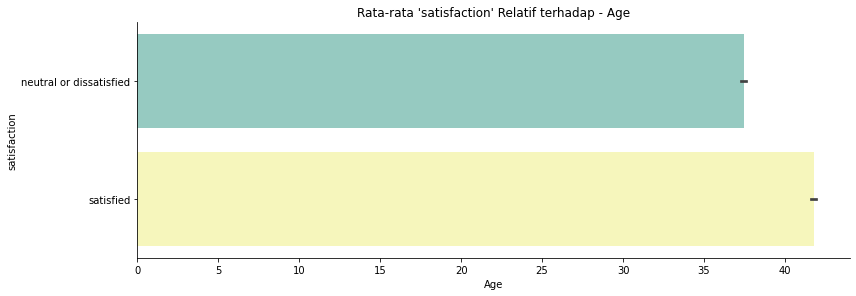

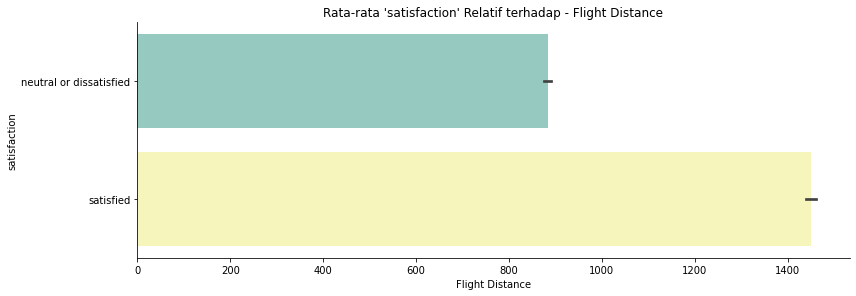

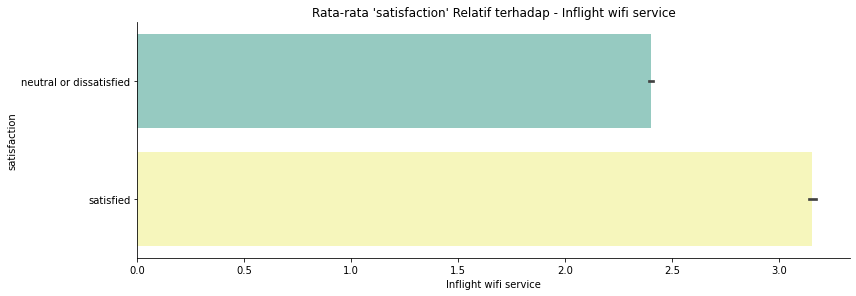

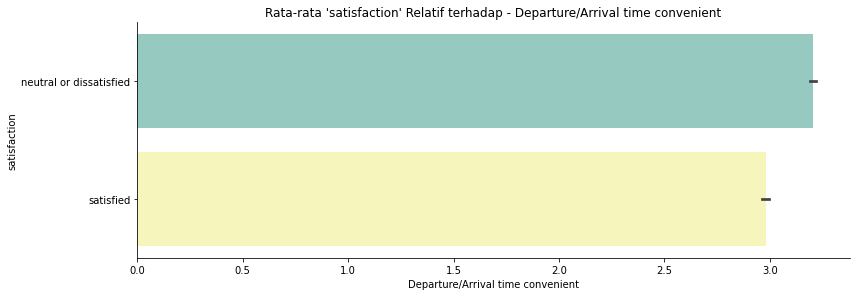

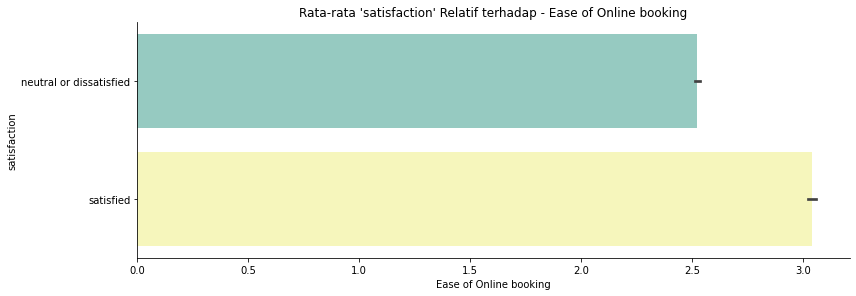

...

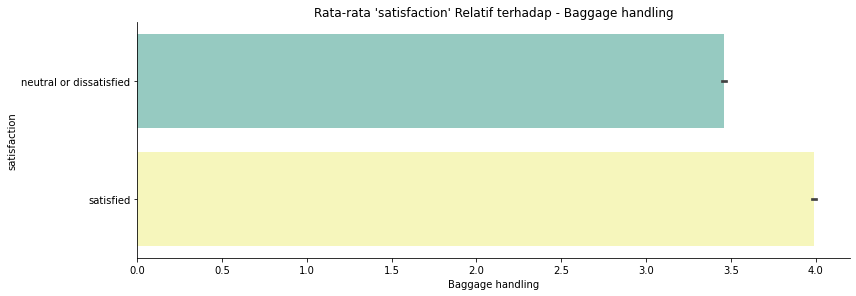

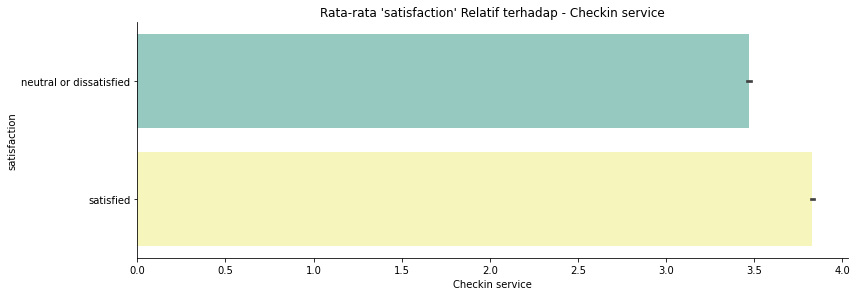

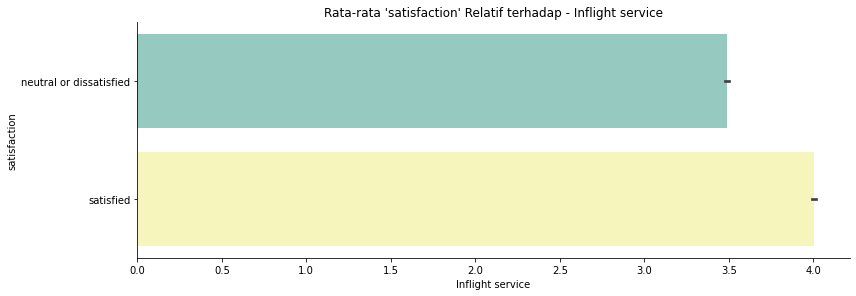

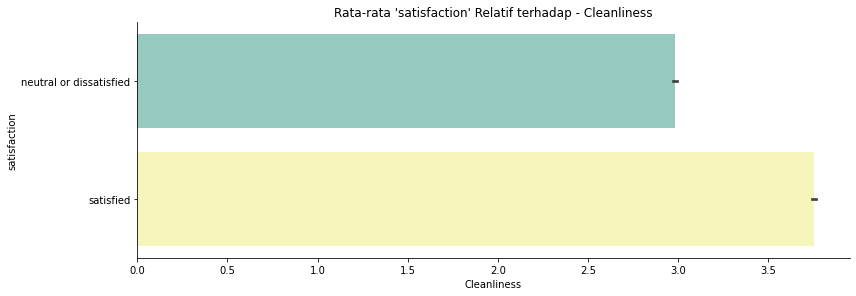

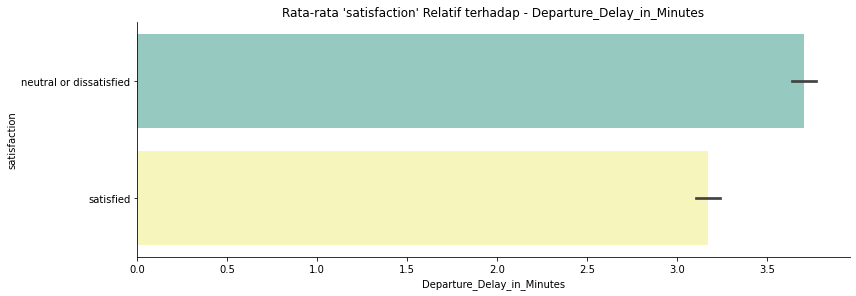

In [40]:
#kategorical features untuk mengecek rata-rata kepuasan
cat_features = df.select_dtypes(include='int64').columns.to_list()
 
for col in cat_features:
  sns.catplot(x=col, y="satisfaction", kind="bar", dodge=False, height = 4, aspect = 3,  data=df, palette="Set3")
  plt.title("Rata-rata 'satisfaction' Relatif terhadap - {}".format(col))

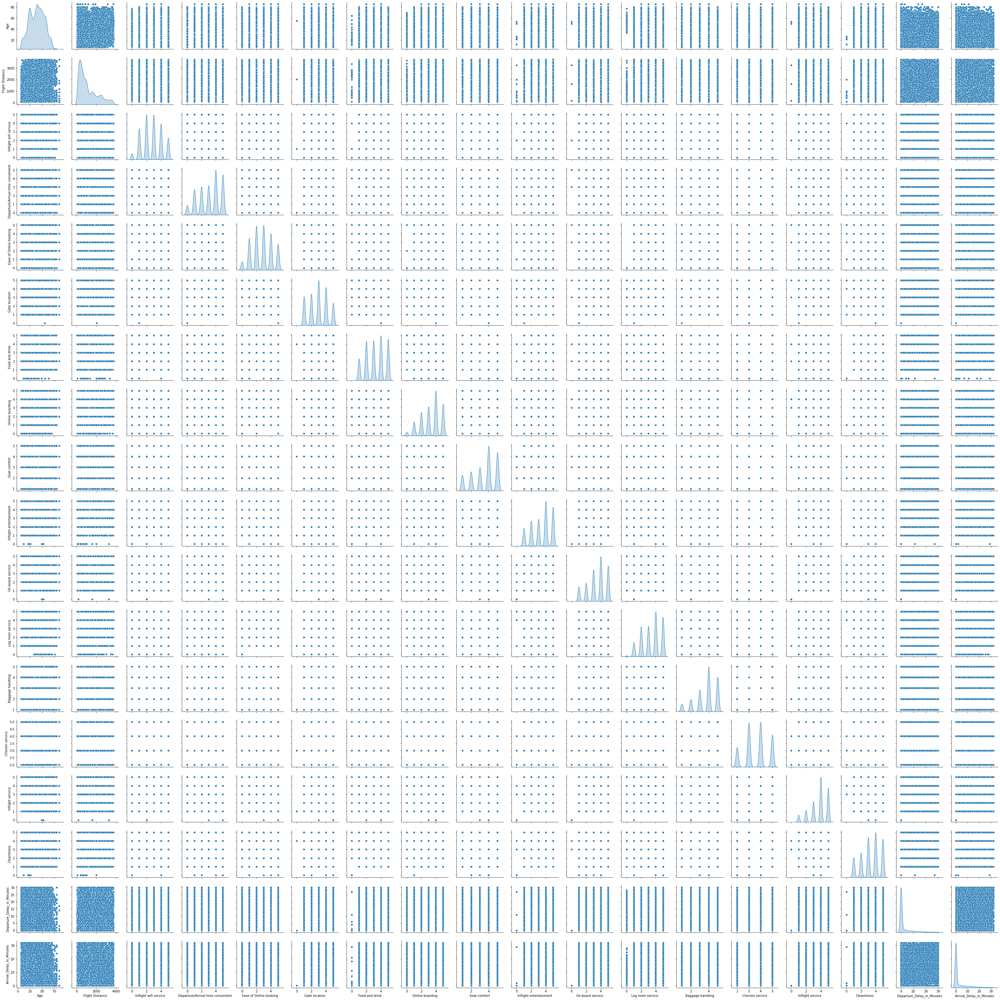

In [41]:
# mengamati hubungan antar fitur numerik dengan fungsi pairplot()
sns.pairplot(df, diag_kind = 'kde')

Text(0.5, 1.0, 'Korelasi Matrix untuk Fitur Numerik ')

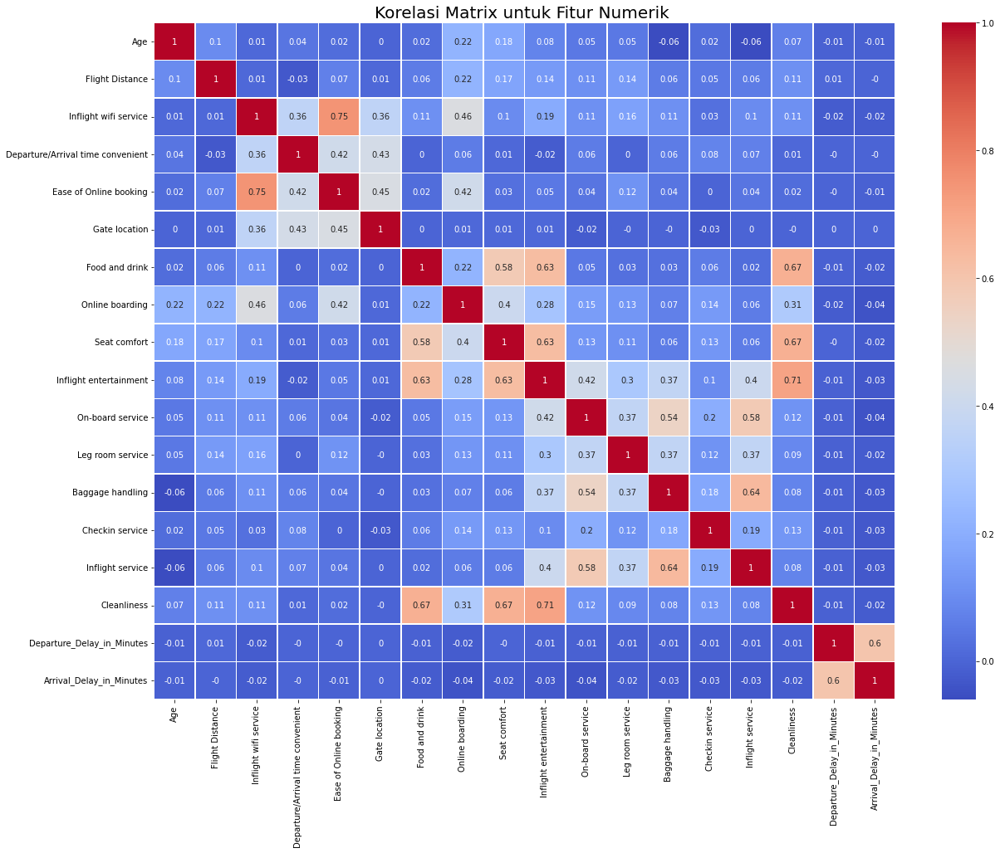

In [42]:
#Untuk mengevaluasi skor korelasinya, gunakan fungsi corr()
plt.figure(figsize=(20, 15))
correlation_matrix = df.corr().round(2)
sns.heatmap(data=correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, )
plt.title("Korelasi Matrix untuk Fitur Numerik ", size=20)

## **Data Preparation**

#### **Penerapan One-Hot-Encoding**

In [43]:
#data preparation penerapan teknik one-hot-encoding
df = pd.concat([df, pd.get_dummies(df['Gender'], prefix='Gender', drop_first=True)],axis=1)
df = pd.concat([df, pd.get_dummies(df['Customer Type'], prefix='Customer Type', drop_first=True)],axis=1)
df = pd.concat([df, pd.get_dummies(df['Type of Travel'], prefix='Type of Travel', drop_first=True)],axis=1)
df = pd.concat([df, pd.get_dummies(df['Class'], prefix='Class', drop_first=True)],axis=1)
df = pd.concat([df, pd.get_dummies(df['satisfaction'], prefix='satisfaction', drop_first=True)],axis=1)

df.drop(['Gender','Customer Type','Type of Travel','Class','satisfaction'], axis=1, inplace=True)
df.head()

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Gender_Male,Customer Type_disloyal Customer,Type of Travel_Personal Travel,Class_Eco,Class_Eco Plus,satisfaction_satisfied
0,13,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,1,0,1,0,1,0
2,26,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,0,0,0,0,0,1
4,61,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1,0,0,0,0,1
5,26,1180,3,4,2,1,1,2,1,1,3,4,4,4,4,1,0,0.0,0,0,1,1,0,0
6,47,1276,2,4,2,3,2,2,2,2,3,3,4,3,5,2,9,23.0,1,0,1,1,0,0


#### **Penerapan Reduksi Dimensi dengan PCA**

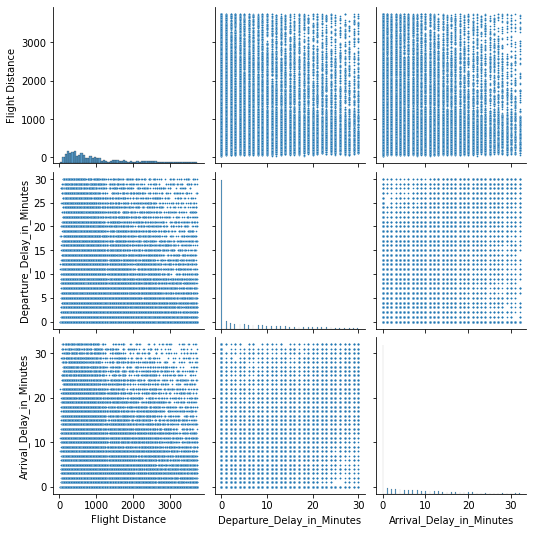

In [44]:
#penerapan Reduksi Dimensi dengan PCA
sns.pairplot(df[['Flight Distance', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']], plot_kws={"s": 3});

In [45]:
#aplikasikan class PCA dari library scikit learn
pca = PCA(n_components=3, random_state=123)
pca.fit(df[['Flight Distance', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']])
princ_comp = pca.transform(df[['Flight Distance', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']])

In [46]:
#mengetahui proporsi informasi dari ketiga komponen
pca.explained_variance_ratio_.round(4)

array([9.999e-01, 1.000e-04, 0.000e+00])

In [47]:
#df.head()
pca = PCA(n_components=1, random_state=123)
pca.fit(df[['Flight Distance', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']])
df['Delay'] = pca.transform(df.loc[:, ('Flight Distance', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes')]).flatten()
df.drop(['Flight Distance', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes'], axis=1, inplace=True)
df.head()

,Age,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Gender_Male,Customer Type_disloyal Customer,Type of Travel_Personal Travel,Class_Eco,Class_Eco Plus,satisfaction_satisfied,Delay
0,13,3,4,3,1,5,3,5,5,4,3,4,4,5,5,1,0,1,0,1,0,-687.036370
2,26,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,0,0,0,1,-5.038443
4,61,3,3,3,3,4,5,5,3,3,4,4,3,3,3,1,0,0,0,0,1,-933.038439
5,26,3,4,2,1,1,2,1,1,3,4,4,4,4,1,0,0,1,1,0,0,32.961557
6,47,2,4,2,3,2,2,2,2,3,3,4,3,5,2,1,0,1,1,0,0,128.962069


#### **Penerapan Train-Test-Split**

In [48]:
#pengaplikasian fungsi train_test_split dari sklearn
 
X = df.drop(["satisfaction_satisfied"],axis =1)
y = df["satisfaction_satisfied"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state = 123)

In [49]:
#mengecek jumlah sampel pada masing-masing bagian
print(f'Total # of sample in whole dataset: {len(X)}')
print(f'Total # of sample in train dataset: {len(X_train)}')
print(f'Total # of sample in test dataset: {len(X_test)}')

Total # of sample in whole dataset: 74743
Total # of sample in train dataset: 67268
Total # of sample in test dataset: 7475


#### **Penerapan Standarisasi**

In [50]:
#Penerapan StandardScaler fitur standarisasi pada data latih
 
numerical_features = ['Age', 'Delay']
scaler = StandardScaler()
scaler.fit(X_train[numerical_features])
X_train[numerical_features] = scaler.transform(X_train.loc[:, numerical_features])
X_train[numerical_features].head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Age,Delay
40832,1.293647,1.808414
23066,0.764352,-0.629305
29646,1.029000,-0.416115
81726,-1.088180,-0.083404
23018,-0.757371,-0.210458


In [51]:
#proses standarisasi mengubah nilai rata-rata (mean) menjadi 0 
#dan nilai standar deviasi menjadi 1
X_train[numerical_features].describe().round(4)

,Age,Delay
count,67268.0000,67268.0000
mean,-0.0000,0.0000
std,1.0000,1.0000
min,-2.1468,-1.2000
25%,-0.8235,-0.7930
50%,0.0366,-0.3343
75%,0.7644,0.6014
max,3.0139,2.7893


## **Model Development**

#### **Penerapan Model SVM**

In [52]:
#Menerapkan SVm
svm = svm.SVC(kernel='linear', probability=True, verbose=True)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)

[LibSVM]

In [53]:
# menyimpan hasil prediksi baik sebagai probabilitas maupun sebagai kelas
y_preds = svm.predict(X_test)
y_proba = svm.predict_proba(X_test)

In [54]:
#membentuk kembali y_probake vektor 1D
y_proba = y_proba[:,1].reshape((y_proba.shape[0],))

In [55]:
y_proba[:5], y_preds[:5], y_test[:5]

(array([0.99998809, 0.96357723, 0.00140219, 0.02980659, 0.95402754]),
 array([1, 1, 0, 0, 1], dtype=uint8),
 81205    1
 8777     0
 56987    1
 91178    0
 29430    1
 Name: satisfaction_satisfied, dtype: uint8)

In [56]:
# Model Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.4816053511705686


#### **Penerapan Model Adaptive Boosting**

In [57]:
#Penerapan metode adaptive boosting.
 
AdaBoost = AdaBoostClassifier(n_estimators=50,learning_rate=1)

model = AdaBoost.fit(X_train, y_train)

y_pred = model.predict(X_test)

In [58]:
# Model Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.9293645484949833


#### **Penerapan Model Random Forest**

In [59]:
#penerapan algoritma random forest

RandomForest = RandomForestClassifier(n_estimators=100, 
                               bootstrap = True,
                               max_features = 'sqrt')
model = RandomForest.fit(X_train, y_train)

y_pred = model.predict(X_test) 

In [60]:
# Prediksi kelas yang sebenarnya
rf_predictions = model.predict(X_test)
# Probabilitas untuk setiap kelas
rf_probs = model.predict_proba(X_test)[:, 1]

In [61]:
# Mengitung roc auc
from sklearn.metrics import roc_auc_score

roc_value = roc_auc_score(y_test, rf_probs)

In [62]:
# Model Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.954247491638796


Proses Scalling

In [63]:
#proses scaling antara data latih dan data uji Evaluasi model
X_test.loc[:, numerical_features] = scaler.transform(X_test[numerical_features])


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## **Evaluasi Model**

### Confusion Matrix

In [64]:
# menghitung comfusion matrix
conf = metrics.confusion_matrix(y_test, y_preds)
conf

array([[2262, 1658],
       [2217, 1338]])

In [65]:
#mengimplementasikan comfusion matrix
def get_confusion_matrix(y_true, y_pred):
    n_classes = len(np.unique(y_true))
    conf = np.zeros((n_classes, n_classes))
    for actual, pred in zip(y_true, y_pred):
        conf[int(actual)][int(pred)] += 1
    return conf.astype('int')

In [66]:
conf = get_confusion_matrix(y_test, y_preds)
conf

array([[2262, 1658],
       [2217, 1338]])

In [67]:
#evaluasi ketiga model
prediksi = pd.DataFrame(columns=['train', 'test'], index=['RandomForest','AdaBoost','SVM'])
model_dict = {'RandomForest': RandomForest, 'AdaBoost': AdaBoost, 'SVM': svm}
for name, model in model_dict.items():
    prediksi.loc[name, 'train'] = confusion_matrix(y_true=y_train, y_pred=model.predict(X_train))/1e3 
    prediksi.loc[name, 'test'] = confusion_matrix(y_true=y_test, y_pred=model.predict(X_test))/1e3

prediksi

,train,test
RandomForest,"[[35.979, 0.0], [0.0, 31.289]]","[[3.827, 0.093], [0.188, 3.367]]"
AdaBoost,"[[33.796, 2.183], [2.483, 28.806]]","[[3.674, 0.246], [0.267, 3.288]]"
SVM,"[[32.74, 3.239], [4.951, 26.338]]","[[3.577, 0.343], [0.568, 2.987]]"


Text(0.5, 15.0, 'Label Prediksi')

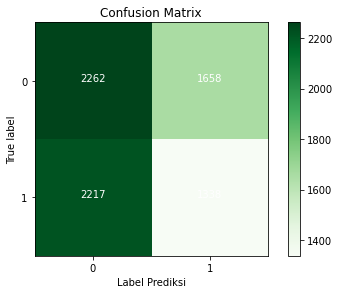

In [68]:
# plot confusion matrix
classes = [0, 1]
plt.imshow(conf, interpolation='nearest', cmap=plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes)
plt.yticks(tick_marks, classes)

fmt = 'd'
thresh = conf.max() / 2.
for i, j in itertools.product(range(conf.shape[0]), range(conf.shape[1])):
    plt.text(j, i, format(conf[i, j], fmt),
             horizontalalignment="center",
             color="white" if conf[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Label Prediksi')

In [69]:
#hasil dari confusion matrix
TP = true_pos = 2987
TN = true_neg = 3577
FP = false_pos = 343
FN = false_neg = 568

Menghitung beberapa metrik dasar dari keempat nilai

In [71]:
results = {}

#### **Accuracy**
Jumlah contoh yang diprediksi dengan benar / jumlah total contoh. 
![Rumus Accuracy](https://wikimedia.org/api/rest_v1/media/math/render/svg/c72ec21ef2505c2d376e96197637fc64f75e5891)

In [72]:
#Accuracy
metric = "ACC"
results[metric] = (TP + TN) / (TP + TN + FP + FN)
print(f"{metric} is {results[metric]: .3f}")

ACC is  0.878


#### **True Positive Rate**
Jumlah sampel sebenarnya dan diprediksi sebagai Positif / jumlah sampel sebenarnya Positif disebut juga dengan **Sensitivity or Recall**.  
![Rumus Recall](https://wikimedia.org/api/rest_v1/media/math/render/svg/64d5540cbadeb83f864d7a731b7ab43cccd0f353)


In [73]:
# Recall
metric = "TPR"
results[metric] = TP / (TP + FN)
print(f"{metric} is {results[metric]: .3f}")

TPR is  0.840


#### **True Negative Rate**
Jumlah sampel sebenarnya dan diprediksi sebagai Negatif / jumlah sampel sebenarnya Negatif disebut juga dengan **Specificity**.  
![Rumus Specificity](https://wikimedia.org/api/rest_v1/media/math/render/svg/aac65b6586cb61c1268403895012c2a8f19b0c5e)


In [74]:
# Specificity
metric = "TNR"
results[metric] = TN / (TN + FP)
print(f"{metric} is {results[metric]: .3f}")

TNR is  0.912


#### **Positive Predictive Value**
Jumlah sampel sebenarnya dan diprediksi sebagai Positif / jumlah sampel yang diprediksi sebagai Positif disebut juga dengan **Precision**.  
![Rumus Precision](https://wikimedia.org/api/rest_v1/media/math/render/svg/699fcdb880b7f6a92742bc0845b8b60b59806a98)


In [75]:
# Precision
metric = "PPV"
results[metric] = TP / (TP + FP)
print(f"{metric} is {results[metric]: .3f}")

PPV is  0.897


#### **F1 score**
Rata-rata Harmonic dari Presisi dan Recall.                                                                                     
![Rumus F1 score](https://wikimedia.org/api/rest_v1/media/math/render/svg/5663ca95d471868169c4e4ea57c936f1b6f4a588)

In [76]:
metric = "F1"
results[metric] = 2 / (1 / results["PPV"] + 1 / results["TPR"])
print(f"{metric} is {results[metric]: .3f}")

F1 is  0.868


#### **Membandingkan metrik yang dihitung ini**

In [77]:
print(f"Calculated and Actual Accuracy:                          {results['ACC']: .3f}, {metrics.accuracy_score(y_test, y_preds): .3f}")
print(f"Calculated and Actual Precision score:                   {results['PPV']: .3f}, {metrics.precision_score(y_test, y_preds): .3f}")
print(f"Calculated and Actual Recall score:                      {results['TPR']: .3f}, {metrics.recall_score(y_test, y_preds): .3f}")
print(f"Calculated and Actual F1 score:                          {results['F1']: .3f}, {metrics.f1_score(y_test, y_preds): .3f}")

Calculated and Actual Accuracy:                           0.878,  0.482
Calculated and Actual Precision score:                    0.897,  0.447
Calculated and Actual Recall score:                       0.840,  0.376
Calculated and Actual F1 score:                           0.868,  0.408
